<a href="https://colab.research.google.com/github/mustaidahmed/ores/blob/main/week9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [133]:
data_health = pd.read_csv('Health.csv')
data_health

,year,fips,state_fips,county_fips,county_name,state_name,state_abbr,metro_nonmetro,uninsured,population_18to64
0,2008,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4933,31300
1,2009,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5492,30571
2,2011,1001,1,1,Autauga County,Alabama,AL,Metropolitan,6065,33764
3,2014,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4780,33627
4,2013,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5845,33539
...,...,...,...,...,...,...,...,...,...,...
25136,2008,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,859,4173
25137,2013,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,761,4115
25138,2011,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,835,4149
25139,2009,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,858,4078


In [8]:
# Display basic information about the dataset
print(data_health.info())

# Display the first few rows of the dataset
print(data_health.head())

# Generate summary statistics
print(data_health.describe())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25141 entries, 0 to 25140
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   year               25141 non-null  int64 
 1   fips               25141 non-null  int64 
 2   state_fips         25141 non-null  int64 
 3   county_fips        25141 non-null  int64 
 4   county_name        25141 non-null  object
 5   state_name         25141 non-null  object
 6   state_abbr         25141 non-null  object
 7   metro_nonmetro     25141 non-null  object
 8   uninsured          25141 non-null  int64 
 9   population_18to64  25141 non-null  int64 
dtypes: int64(6), object(4)
memory usage: 1.9+ MB
None
   year  fips  state_fips  county_fips     county_name state_name state_abbr  \
0  2008  1001           1            1  Autauga County    Alabama         AL   
1  2009  1001           1            1  Autauga County    Alabama         AL   
2  2011  1001           1       

In [134]:
data_health.isna()

,year,fips,state_fips,county_fips,county_name,state_name,state_abbr,metro_nonmetro,uninsured,population_18to64
0,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...
25136,False,False,False,False,False,False,False,False,False,False
25137,False,False,False,False,False,False,False,False,False,False
25138,False,False,False,False,False,False,False,False,False,False
25139,False,False,False,False,False,False,False,False,False,False


In [135]:
data_health.isna().sum()

year                 0
fips                 0
state_fips           0
county_fips          0
county_name          0
state_name           0
state_abbr           0
metro_nonmetro       0
uninsured            0
population_18to64    0
dtype: int64

In [143]:
data_health['Country'] = 'USA'
data_health

,year,fips,state_fips,county_fips,county_name,state_name,state_abbr,metro_nonmetro,uninsured,population_18to64,Country
0,2008,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4933,31300,USA
1,2009,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5492,30571,USA
2,2011,1001,1,1,Autauga County,Alabama,AL,Metropolitan,6065,33764,USA
3,2014,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4780,33627,USA
4,2013,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5845,33539,USA
...,...,...,...,...,...,...,...,...,...,...,...
25136,2008,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,859,4173,USA
25137,2013,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,761,4115,USA
25138,2011,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,835,4149,USA
25139,2009,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,858,4078,USA


In [148]:
data = data_health.drop(columns=['Country'])
data

,year,fips,state_fips,county_fips,county_name,state_name,state_abbr,metro_nonmetro,uninsured,population_18to64
0,2008,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4933,31300
1,2009,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5492,30571
2,2011,1001,1,1,Autauga County,Alabama,AL,Metropolitan,6065,33764
3,2014,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4780,33627
4,2013,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5845,33539
...,...,...,...,...,...,...,...,...,...,...
25136,2008,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,859,4173
25137,2013,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,761,4115
25138,2011,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,835,4149
25139,2009,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,858,4078


In [150]:
data.shape

(25141, 10)

In [149]:
data.drop_duplicates

<bound method DataFrame.drop_duplicates of        year   fips  state_fips  county_fips     county_name state_name  \
0      2008   1001           1            1  Autauga County    Alabama   
1      2009   1001           1            1  Autauga County    Alabama   
2      2011   1001           1            1  Autauga County    Alabama   
3      2014   1001           1            1  Autauga County    Alabama   
4      2013   1001           1            1  Autauga County    Alabama   
...     ...    ...         ...          ...             ...        ...   
25136  2008  56045          56           45   Weston County    Wyoming   
25137  2013  56045          56           45   Weston County    Wyoming   
25138  2011  56045          56           45   Weston County    Wyoming   
25139  2009  56045          56           45   Weston County    Wyoming   
25140  2010  56045          56           45   Weston County    Wyoming   

      state_abbr   metro_nonmetro  uninsured  population_18to64  
0 

In [21]:
# Data Type Adjustment
data['year'] = data['year'].astype('int64')
data['fips'] = data['fips'].astype('int64')
data['state_fips'] = data['state_fips'].astype('int64')
data['county_fips'] = data['county_fips'].astype('int64')

# Check data types after adjustments
print(data.dtypes)



year                  int64
fips                  int64
state_fips            int64
county_fips           int64
county_name          object
state_name           object
state_abbr           object
metro_nonmetro       object
uninsured             int64
population_18to64     int64
dtype: object


In [152]:
data.rename(columns={
    'year': 'Year',
    'fips': 'FIPS',
    'state_fips': 'State_FIPS',
    'county_fips': 'County_FIPS',
    'county_name': 'County_Name',
    'state_name': 'State_Name',
    'state_abbr': 'State_Abbr',
    'metro_nonmetro': 'Metro_Nonmetro',
    'uninsured': 'Uninsured',
    'population_18to64': 'Population_18to64'
}, inplace=True)

# Check updated column names
print(data.columns)


Index(['Year', 'FIPS', 'State_FIPS', 'County_FIPS', 'County_Name',
       'State_Name', 'State_Abbr', 'Metro_Nonmetro', 'Uninsured',
       'Population_18to64'],
      dtype='object')


In [153]:
#  strip leading/trailing spaces
columns_to_strip = [ 'County_Name', 'State_Name', 'State_Abbr', 'Metro_Nonmetro']

for column in columns_to_strip:
    data[column] = data[column].str.strip()



creating a calculated field based on two other columns

In [159]:
data['Uninsured_rate'] = data['Uninsured'] / data['Population_18to64']
data

,Year,FIPS,State_FIPS,County_FIPS,County_Name,State_Name,State_Abbr,Metro_Nonmetro,Uninsured,Population_18to64,Uninsured_rate
0,2008,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4933,31300,0.157604
1,2009,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5492,30571,0.179647
2,2011,1001,1,1,Autauga County,Alabama,AL,Metropolitan,6065,33764,0.179629
3,2014,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4780,33627,0.142148
4,2013,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5845,33539,0.174275
...,...,...,...,...,...,...,...,...,...,...,...
25136,2008,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,859,4173,0.205847
25137,2013,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,761,4115,0.184933
25138,2011,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,835,4149,0.201253
25139,2009,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,858,4078,0.210397


creating a new calcutaled column called insured_population

In [171]:
data['Insured_Population_18to64'] = data['Population_18to64'] - data['Uninsured']
data

,Year,FIPS,State_FIPS,County_FIPS,County_Name,State_Name,State_Abbr,Metro_Nonmetro,Uninsured,Population_18to64,Uninsured_rate,Insured_Population_18to64
0,2008,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4933,31300,0.157604,26367
1,2009,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5492,30571,0.179647,25079
2,2011,1001,1,1,Autauga County,Alabama,AL,Metropolitan,6065,33764,0.179629,27699
3,2014,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4780,33627,0.142148,28847
4,2013,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5845,33539,0.174275,27694
...,...,...,...,...,...,...,...,...,...,...,...,...
25136,2008,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,859,4173,0.205847,3314
25137,2013,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,761,4115,0.184933,3354
25138,2011,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,835,4149,0.201253,3314
25139,2009,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,858,4078,0.210397,3220


<Axes: >

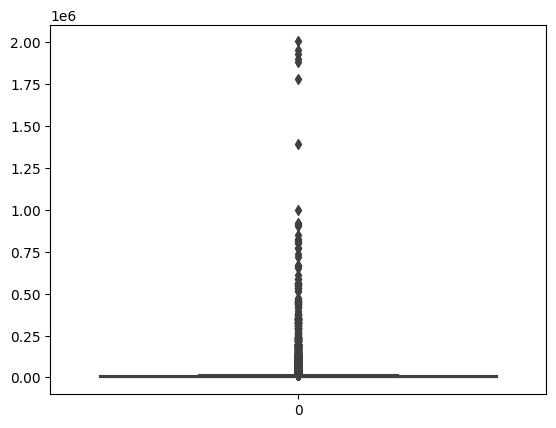

In [60]:
sns.boxplot(data['Uninsured'])

<Axes: >

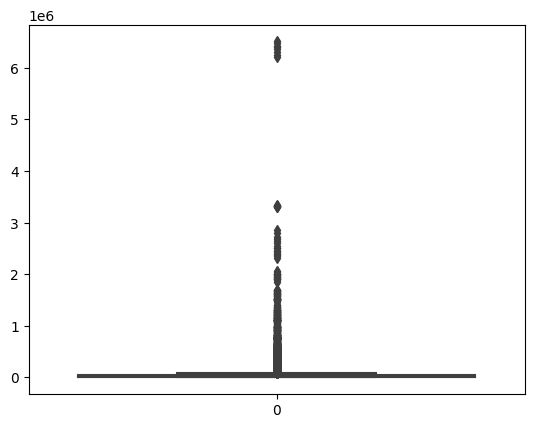

In [61]:
sns.boxplot(data['Population_18to64'])

In [172]:
data.describe()

,Year,FIPS,State_FIPS,County_FIPS,Uninsured,Population_18to64,Uninsured_rate,Insured_Population_18to64
count,25141.000000,25141.000000,25141.000000,25141.000000,2.514100e+04,2.514100e+04,25133.000000,2.514100e+04
mean,2011.499901,30389.848137,30.286146,103.702001,1.163419e+04,6.071559e+04,0.200947,4.908139e+04
std,2.291203,15161.305000,15.143056,107.896622,4.898463e+04,2.009160e+05,0.070529,1.554101e+05
min,2008.000000,1001.000000,1.000000,1.000000,0.000000e+00,0.000000e+00,0.026159,0.000000e+00
25%,2010.000000,18177.000000,18.000000,35.000000,1.218000e+03,6.257000e+03,0.148736,4.857000e+03
50%,2011.000000,29177.000000,29.000000,79.000000,2.936000e+03,1.489600e+04,0.198357,1.176600e+04
75%,2013.000000,45083.000000,45.000000,133.000000,7.423000e+03,3.966300e+04,0.248206,3.209300e+04
max,2015.000000,56045.000000,56.000000,840.000000,2.002197e+06,6.507904e+06,0.525405,5.507361e+06


In [62]:
import numpy as np

# Define the column containing the data with potential outliers (e.g., 'Uninsured_rate')
data_column = 'Uninsured'

# Calculate the IQR
Q1 = data[data_column].quantile(0.25)
Q3 = data[data_column].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Find outliers
outliers = data[(data[data_column] < lower_bound) | (data[data_column] > upper_bound)]

# Display the outliers
print(outliers)


       Year   FIPS  State_FIPS  County_FIPS      County_Name State_Name  \
8      2013   1003           1            3   Baldwin County    Alabama   
9      2009   1003           1            3   Baldwin County    Alabama   
10     2015   1003           1            3   Baldwin County    Alabama   
11     2008   1003           1            3   Baldwin County    Alabama   
12     2012   1003           1            3   Baldwin County    Alabama   
...     ...    ...         ...          ...              ...        ...   
24919  2011  55133          55          133  Waukesha County  Wisconsin   
24920  2012  55133          55          133  Waukesha County  Wisconsin   
24922  2008  55133          55          133  Waukesha County  Wisconsin   
24923  2009  55133          55          133  Waukesha County  Wisconsin   
24924  2013  55133          55          133  Waukesha County  Wisconsin   

      State_Abbr Metro_Nonmetro  Uninsured  Population_18to64  Uninsured_rate  \
8             AL  

In [186]:
import numpy as np

# Define the column containing the data with potential outliers (e.g., 'Uninsured_rate')
data_column = 'Population_18to64'

# Calculate the IQR
Q1 = data[data_column].quantile(0.25)
Q3 = data[data_column].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Find outliers
outliers = data[(data[data_column] < lower_bound) | (data[data_column] > upper_bound)]

# Display the outliers
print(outliers)


       Year   FIPS  State_FIPS  County_FIPS       County_Name State_Name  \
8      2013   1003           1            3    Baldwin County    Alabama   
9      2009   1003           1            3    Baldwin County    Alabama   
10     2015   1003           1            3    Baldwin County    Alabama   
11     2008   1003           1            3    Baldwin County    Alabama   
12     2012   1003           1            3    Baldwin County    Alabama   
...     ...    ...         ...          ...               ...        ...   
24944  2014  55139          55          139  Winnebago County  Wisconsin   
24945  2008  55139          55          139  Winnebago County  Wisconsin   
24946  2009  55139          55          139  Winnebago County  Wisconsin   
24947  2011  55139          55          139  Winnebago County  Wisconsin   
24948  2015  55139          55          139  Winnebago County  Wisconsin   

      State_Abbr Metro_Nonmetro  Uninsured  Population_18to64  Uninsured_rate  \
8     

removing the outliers

In [187]:
# column containing the data with potential outliers  'Uninsured'
data_column = 'Uninsured'

# Calculate the IQR
Q1 = data[data_column].quantile(0.25)
Q3 = data[data_column].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the outliers
data_clean = data[(data[data_column] >= lower_bound) & (data[data_column] <= upper_bound)]
data_clean

,Year,FIPS,State_FIPS,County_FIPS,County_Name,State_Name,State_Abbr,Metro_Nonmetro,Uninsured,Population_18to64,Uninsured_rate,Insured_Population_18to64
0,2008,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4933,31300,0.157604,26367
1,2009,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5492,30571,0.179647,25079
2,2011,1001,1,1,Autauga County,Alabama,AL,Metropolitan,6065,33764,0.179629,27699
3,2014,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4780,33627,0.142148,28847
4,2013,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5845,33539,0.174275,27694
...,...,...,...,...,...,...,...,...,...,...,...,...
25136,2008,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,859,4173,0.205847,3314
25137,2013,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,761,4115,0.184933,3354
25138,2011,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,835,4149,0.201253,3314
25139,2009,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,858,4078,0.210397,3220


BOXPLOT AFTER THE REMOVAL OF OUTLIERS

In [188]:
# column containing the data with potential outliers  'Uninsured'
data_column = 'Population_18to64'

# Calculate the IQR
Q1 = data[data_column].quantile(0.25)
Q3 = data[data_column].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the outliers
data_clean = data[(data[data_column] >= lower_bound) & (data[data_column] <= upper_bound)]
data_clean

,Year,FIPS,State_FIPS,County_FIPS,County_Name,State_Name,State_Abbr,Metro_Nonmetro,Uninsured,Population_18to64,Uninsured_rate,Insured_Population_18to64
0,2008,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4933,31300,0.157604,26367
1,2009,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5492,30571,0.179647,25079
2,2011,1001,1,1,Autauga County,Alabama,AL,Metropolitan,6065,33764,0.179629,27699
3,2014,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4780,33627,0.142148,28847
4,2013,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5845,33539,0.174275,27694
...,...,...,...,...,...,...,...,...,...,...,...,...
25136,2008,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,859,4173,0.205847,3314
25137,2013,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,761,4115,0.184933,3354
25138,2011,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,835,4149,0.201253,3314
25139,2009,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,858,4078,0.210397,3220


<Axes: >

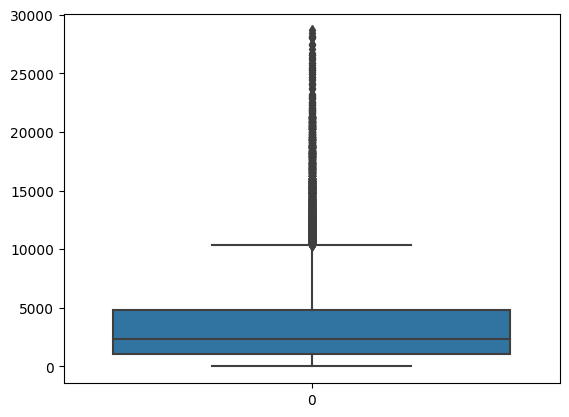

In [190]:
sns.boxplot(data_clean['Uninsured'])

CHECKING THE DATA AFTER REMOVEL OF OUTLIERS

In [191]:
data_clean.describe()

,Year,FIPS,State_FIPS,County_FIPS,Uninsured,Population_18to64,Uninsured_rate,Insured_Population_18to64
count,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21777.000000,21769.000000,21777.000000
mean,2011.495431,30652.916380,30.546907,106.009092,3663.772466,18953.459200,0.204756,15289.686734
std,2.291486,15088.358051,15.071386,108.009123,3864.073088,19110.981388,0.069788,15745.287393
min,2008.000000,1001.000000,1.000000,1.000000,0.000000,0.000000,0.035269,0.000000
25%,2009.000000,19061.000000,19.000000,37.000000,1052.000000,5454.000000,0.153490,4270.000000
50%,2011.000000,29179.000000,29.000000,81.000000,2351.000000,11963.000000,0.202243,9496.000000
75%,2013.000000,46055.000000,46.000000,137.000000,4779.000000,25228.000000,0.251367,20216.000000
max,2015.000000,56045.000000,56.000000,840.000000,28665.000000,89737.000000,0.508696,83844.000000


In [192]:
data_clean

,Year,FIPS,State_FIPS,County_FIPS,County_Name,State_Name,State_Abbr,Metro_Nonmetro,Uninsured,Population_18to64,Uninsured_rate,Insured_Population_18to64
0,2008,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4933,31300,0.157604,26367
1,2009,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5492,30571,0.179647,25079
2,2011,1001,1,1,Autauga County,Alabama,AL,Metropolitan,6065,33764,0.179629,27699
3,2014,1001,1,1,Autauga County,Alabama,AL,Metropolitan,4780,33627,0.142148,28847
4,2013,1001,1,1,Autauga County,Alabama,AL,Metropolitan,5845,33539,0.174275,27694
...,...,...,...,...,...,...,...,...,...,...,...,...
25136,2008,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,859,4173,0.205847,3314
25137,2013,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,761,4115,0.184933,3354
25138,2011,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,835,4149,0.201253,3314
25139,2009,56045,56,45,Weston County,Wyoming,WY,Nonmetropolitan,858,4078,0.210397,3220


In [124]:
encoded_data = pd.get_dummies(data_clean, columns=["Metro_Nonmetro"])
encoded_data

,Year,FIPS,State_FIPS,County_FIPS,County_Name,State_Name,State_Abbr,Uninsured,Population_18to64,Uninsured_rate,Insured_Population_18to64,Metro_Nonmetro_Metropolitan,Metro_Nonmetro_Nonmetropolitan
0,2008,1001,1,1,Autauga County,Alabama,AL,1.008460,1.594775,-0.698128,1.680234,1,0
1,2009,1001,1,1,Autauga County,Alabama,AL,1.257666,1.528939,-0.381282,1.539676,1,0
2,2011,1001,1,1,Autauga County,Alabama,AL,1.513113,1.817300,-0.381543,1.825595,1,0
3,2014,1001,1,1,Autauga County,Alabama,AL,0.940251,1.804928,-0.920290,1.950875,1,0
4,2013,1001,1,1,Autauga County,Alabama,AL,1.415036,1.796981,-0.458506,1.825049,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25136,2008,56045,56,45,Weston County,Wyoming,WY,-0.807757,-0.855076,-0.004695,-0.835526,0,1
25137,2013,56045,56,45,Weston County,Wyoming,WY,-0.851446,-0.860314,-0.305305,-0.831161,0,1
25138,2011,56045,56,45,Weston County,Wyoming,WY,-0.818456,-0.857244,-0.070725,-0.835526,0,1
25139,2009,56045,56,45,Weston County,Wyoming,WY,-0.808203,-0.863656,0.060707,-0.845784,0,1


**DATA VISUALIZATION**

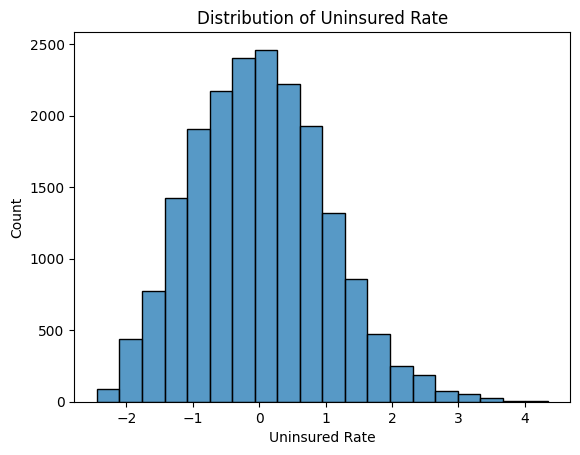

In [125]:
import matplotlib.pyplot as plt
import seaborn as sns

# Example: Creating a histogram for the "Uninsured_rate" column
sns.histplot(data=data_clean, x="Uninsured_rate", bins=20)
plt.title("Distribution of Uninsured Rate")
plt.xlabel("Uninsured Rate")
plt.show()


<ipython-input-126-c2de9843e690>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='Uninsured', ylabel='Density'>

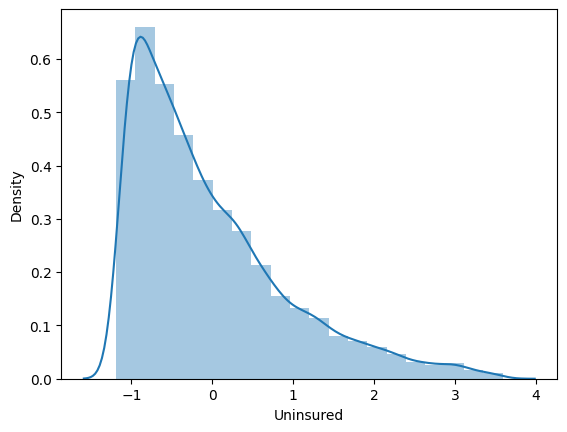

In [126]:
#distribution plots of each parameters
sns.distplot(data_clean['Uninsured'], bins=20)

<ipython-input-127-8805ad017dbc>:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='Population_18to64', ylabel='Density'>

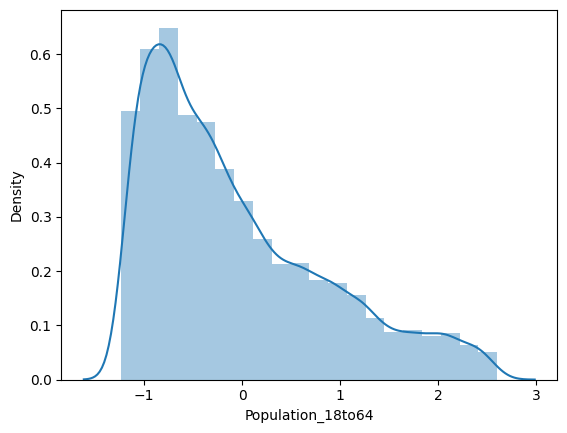

In [127]:
#distribution plots of each parameters
sns.distplot(data_clean['Population_18to64'], bins=20)

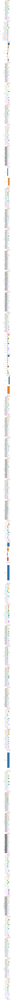

In [128]:
import seaborn as sns
import matplotlib.pyplot as plt

# Group the data by state_name
grouped_data = data_clean.groupby('State_Name')

# Get a list of all unique state names
states = data_clean['State_Name'].unique()

# Set the figure size
plt.figure(figsize=(5, 10 * len(states)))

# Iterate through each state and create a bar plot
for state in states:
    state_data = grouped_data.get_group(state)
    plt.subplot(len(states), 1, states.tolist().index(state) + 1)  # Create a subplot for each state
    sns.barplot(x='Population_18to64', y='County_Name', data=state_data)
    plt.xlabel('Population (18 to 64 years)')
    plt.ylabel('County Name')
    plt.title(f'Bar Plot for {state}')

# Adjust layout
plt.tight_layout()
plt.show()


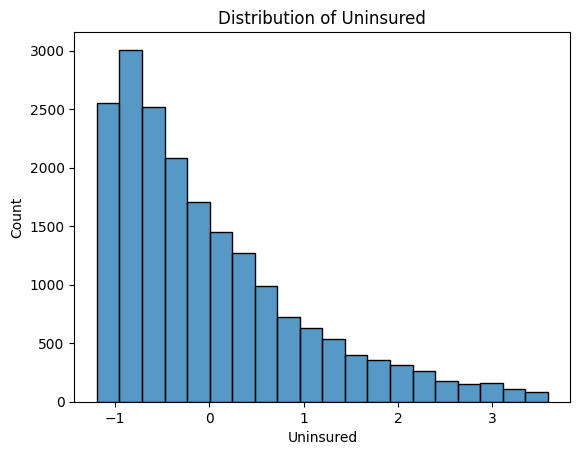

In [93]:
sns.histplot(data=data_clean, x="Uninsured", bins=20)
plt.title("Distribution of Uninsured")
plt.xlabel("Uninsured")
plt.show()


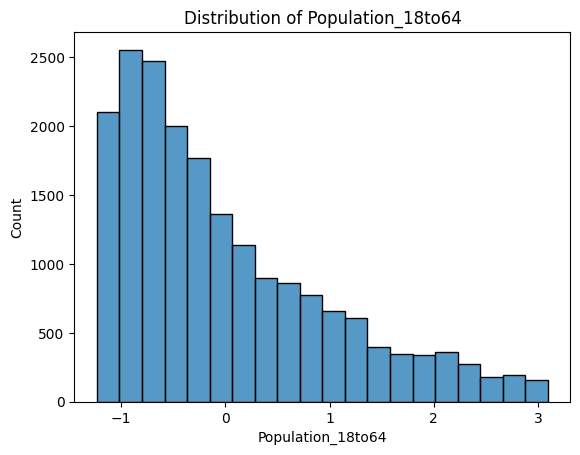

In [94]:
sns.histplot(data=data_clean, x="Population_18to64", bins=20)
plt.title("Distribution of Population_18to64")
plt.xlabel("Population_18to64")
plt.show()


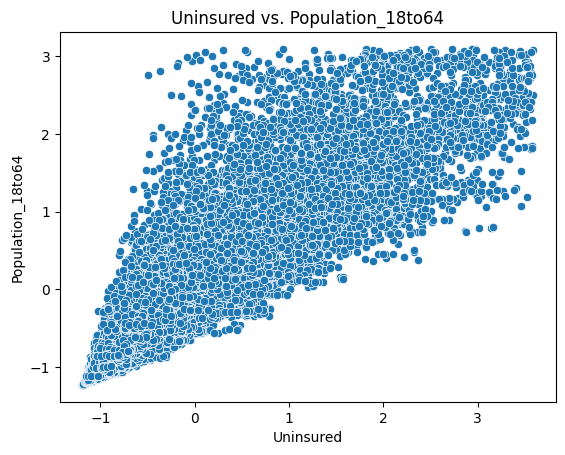

In [95]:
sns.scatterplot(data=data_clean, x="Uninsured", y="Population_18to64")
plt.title("Uninsured vs. Population_18to64")
plt.xlabel("Uninsured")
plt.ylabel("Population_18to64")
plt.show()


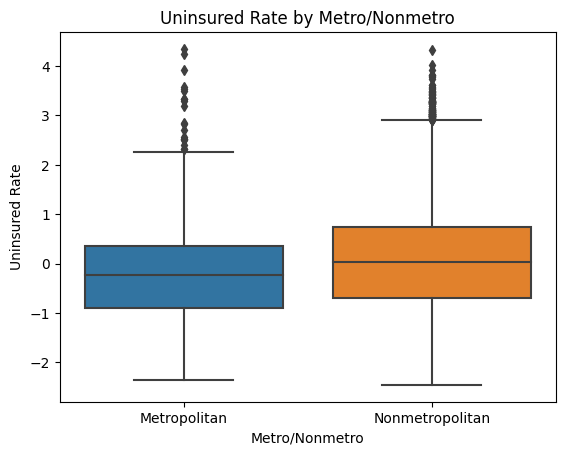

In [96]:
sns.boxplot(data=data_clean, x="Metro_Nonmetro", y="Uninsured_rate")
plt.title("Uninsured Rate by Metro/Nonmetro")
plt.xlabel("Metro/Nonmetro")
plt.ylabel("Uninsured Rate")
plt.show()


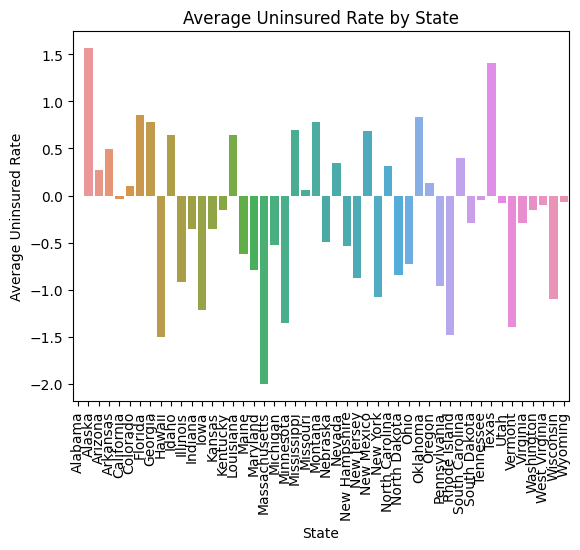

In [97]:
state_avg_uninsured_rate = data.groupby("State_Name")["Uninsured_rate"].mean().reset_index()
sns.barplot(data=state_avg_uninsured_rate, x="State_Name", y="Uninsured_rate")
plt.title("Average Uninsured Rate by State")
plt.xlabel("State")
plt.ylabel("Average Uninsured Rate")
plt.xticks(rotation=90)
plt.show()


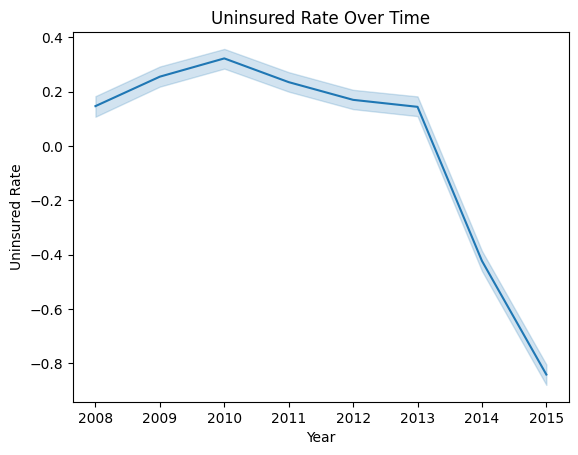

In [98]:
sns.lineplot(data=data_clean, x="Year", y="Uninsured_rate")
plt.title("Uninsured Rate Over Time")
plt.xlabel("Year")
plt.ylabel("Uninsured Rate")
plt.show()


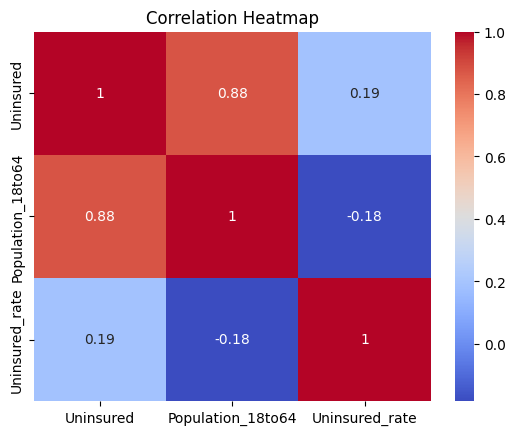

In [99]:
numeric_data = data_clean[["Uninsured", "Population_18to64", "Uninsured_rate"]]
correlation_matrix = numeric_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()


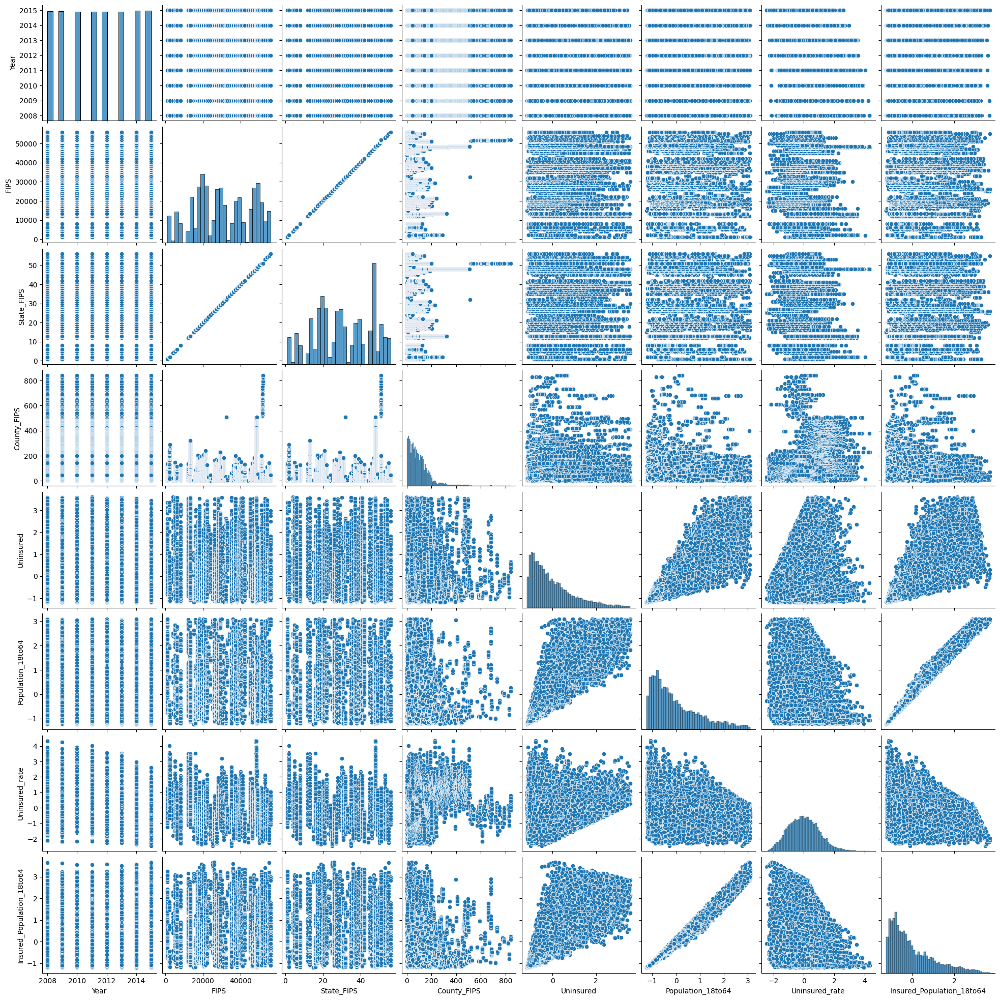

In [100]:
import seaborn as sns
sns.pairplot(data_clean)
plt.show()


<ipython-input-101-27fcc903c877>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.clustermap(data.corr(), cmap="coolwarm", method="average")


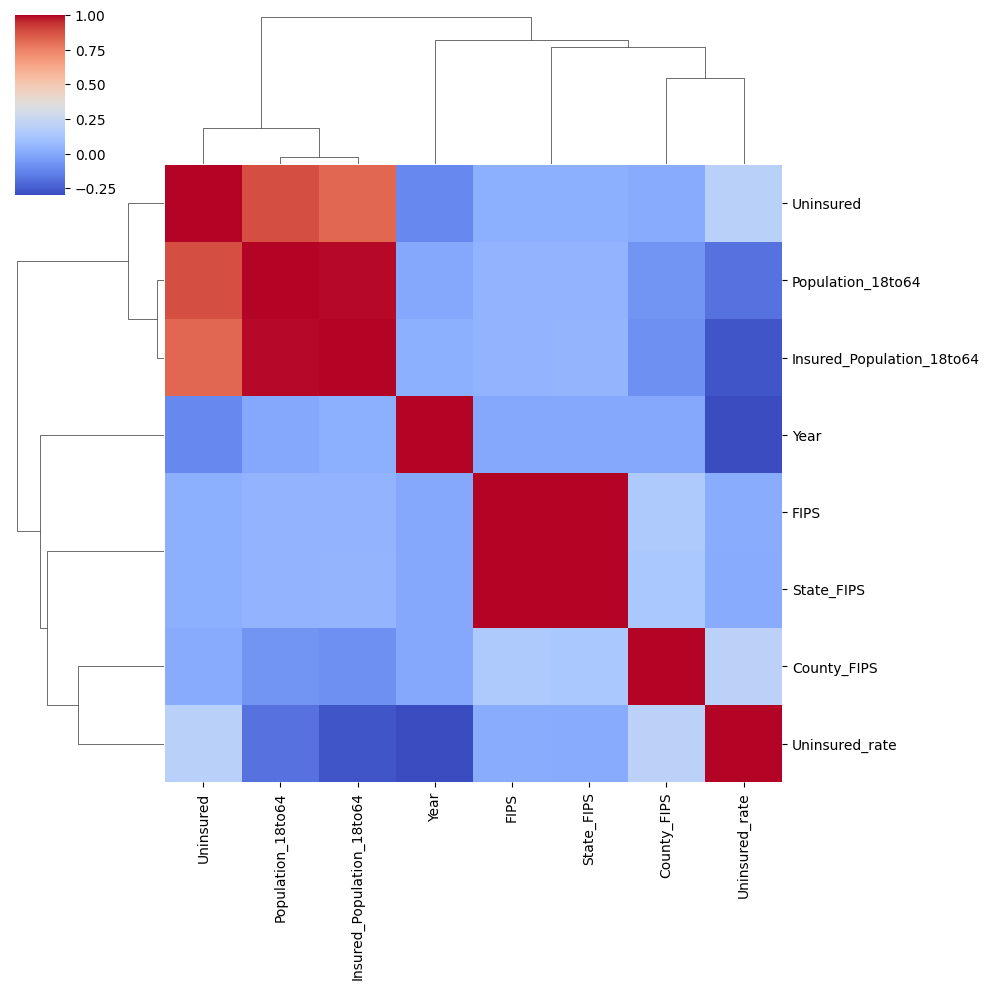

In [101]:
import seaborn as sns
sns.clustermap(data_clean.corr(), cmap="coolwarm", method="average")
plt.show()


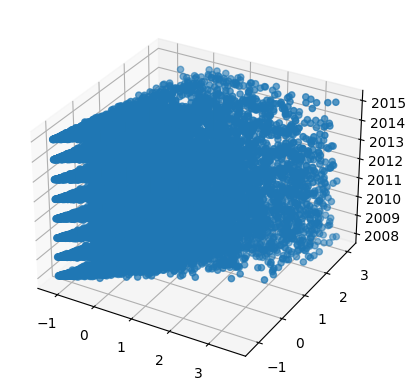

In [108]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data_clean["Uninsured"], data_clean["Population_18to64"], data_clean["Year"])
plt.show()


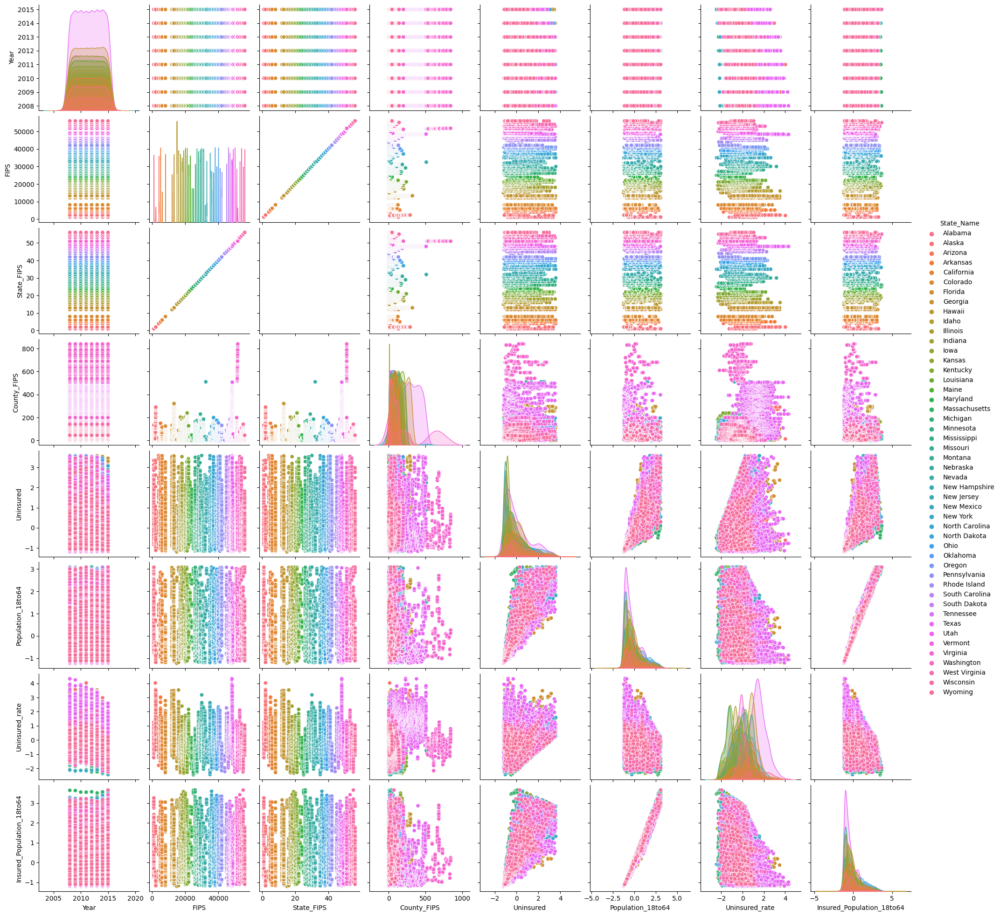

In [110]:
sns.pairplot(data=data_clean, hue='State_Name')

In [129]:
#state analysis
import plotly.express as px
fig = px.sunburst(data_clean, path=['State_Name', 'County_Name', 'State_Abbr'], values='Uninsured')
fig.show()